In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np
import scipy as sc

In [2]:
home = os.getcwd()
print(os.listdir(home))

['.git', '.gitignore', '.ipynb_checkpoints', '01-08-19-V118', '03-05-19-V118', '03-26-19-V118', '08-14-18-V118', 'data_prep.ipynb', 'EDA.ipynb', 'EDA2.ipynb', 'eda2_b.ipynb', 'GPS Files', 'July 6, 2020 Vehicle 118 Expo Line Test Train Data.xlsx', 'Skytrain Linear Asset Database - Consolidated.xlsx', 'SMC DATALOG FOR MAR. 5 TEST TRAIN 118-6.xlsx', 'Switch Maint Works to date - April 2019.xlsx', 'Test Train Sample Noise Data', 'Test Train Sample Noise Data.zip']


In [3]:
os.chdir(home + "\\03-05-19-V118")
print(os.listdir())

['.hubstorinfo', 'ft_first_3000.csv', 'REC0001_ch1.csv', 'REC0001_ch2.csv']


In [4]:
df = pd.read_csv("ft_first_3000.csv", index_col=0)
print(df.info())
print(df.describe())
df.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 0 to 2999
Columns: 512 entries, 0_a to 2550_b
dtypes: float64(512)
memory usage: 11.7 MB
None
               0_a         10_a         20_a         30_a         40_a  \
count  3000.000000  3000.000000  3000.000000  3000.000000  3000.000000   
mean      0.037101     0.028008     0.048659     0.054128     0.065933   
std       0.079003     0.056494     0.082117     0.088397     0.101469   
min       0.003848     0.001356     0.001020     0.000790     0.000666   
25%       0.010065     0.003106     0.002087     0.001626     0.001430   
50%       0.013059     0.007341     0.012673     0.015794     0.023274   
75%       0.028614     0.036555     0.068536     0.073881     0.094594   
max       2.033764     2.000537     1.835664     1.621600     1.327535   

              50_a         60_a         70_a         80_a         90_a  ...  \
count  3000.000000  3000.000000  3000.000000  3000.000000  3000.000000  ...   
mean      0.06118

,0_a,10_a,20_a,30_a,40_a,50_a,60_a,70_a,80_a,90_a,...,2460_b,2470_b,2480_b,2490_b,2500_b,2510_b,2520_b,2530_b,2540_b,2550_b
0,0.009324,0.004050,0.002672,0.001760,0.001433,0.001331,0.000998,0.001136,0.001078,0.000701,...,0.000183,0.000162,0.000155,0.000144,0.000216,0.000147,0.000177,0.000164,0.000167,0.000201
1,0.010478,0.002594,0.002439,0.001606,0.001660,0.001170,0.001057,0.001036,0.000607,0.000956,...,0.000147,0.000173,0.000171,0.000197,0.000195,0.000159,0.000177,0.000175,0.000227,0.000131
2,0.012268,0.002220,0.001751,0.001553,0.001083,0.001107,0.001032,0.000936,0.000885,0.000972,...,0.000173,0.000201,0.000180,0.000201,0.000216,0.000236,0.000191,0.000140,0.000154,0.000092
3,0.010066,0.002121,0.001788,0.001406,0.001413,0.001349,0.000892,0.001149,0.000769,0.000732,...,0.000177,0.000144,0.000218,0.000167,0.000224,0.000156,0.000172,0.000140,0.000254,0.000136
4,0.013675,0.002712,0.001733,0.001963,0.001300,0.002498,0.002263,0.000914,0.000798,0.001317,...,0.000188,0.000185,0.000206,0.000154,0.000196,0.000150,0.000130,0.000183,0.000207,0.000160


In [5]:
from sklearn.cluster import KMeans as km
ten = km(n_clusters=10, random_state=42).fit(df)

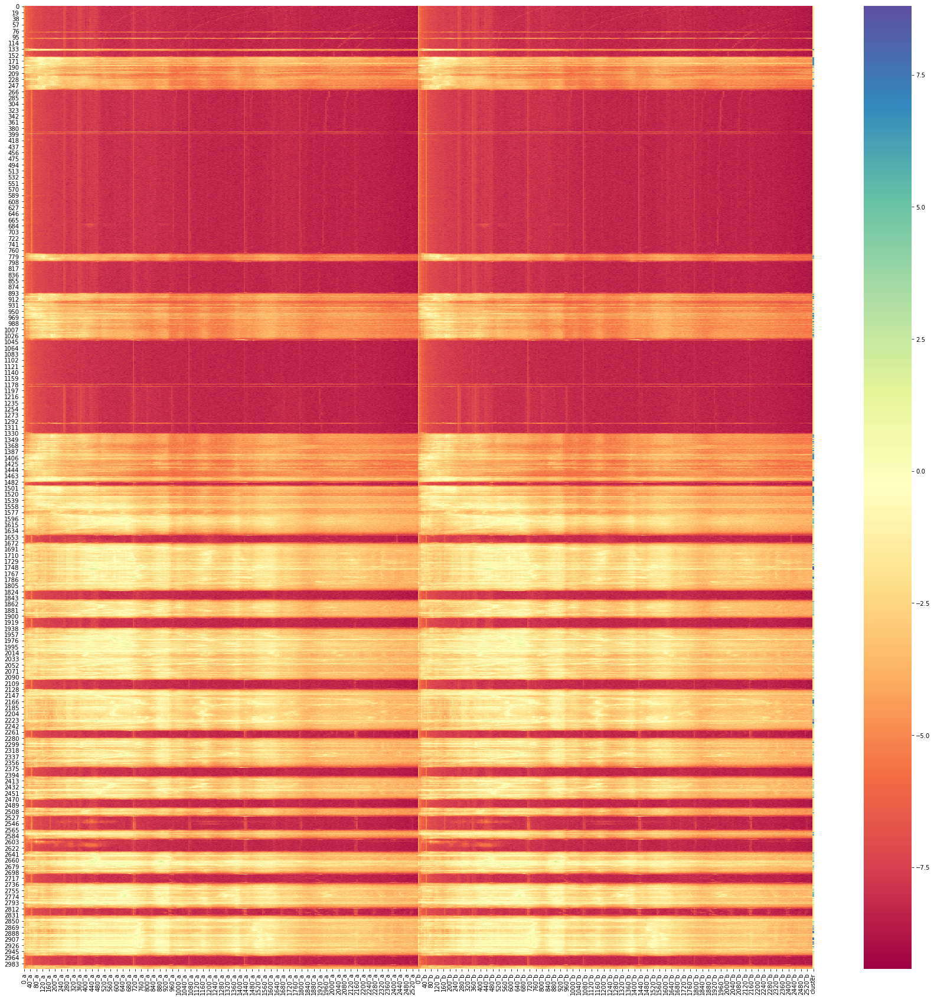

In [6]:
df2 = np.log(df)
df2["cluster"] = (ten.labels_ *1.2) - 2
plt.figure(figsize=(30,30))
sb.heatmap(df2, cmap="Spectral")
plt.show()

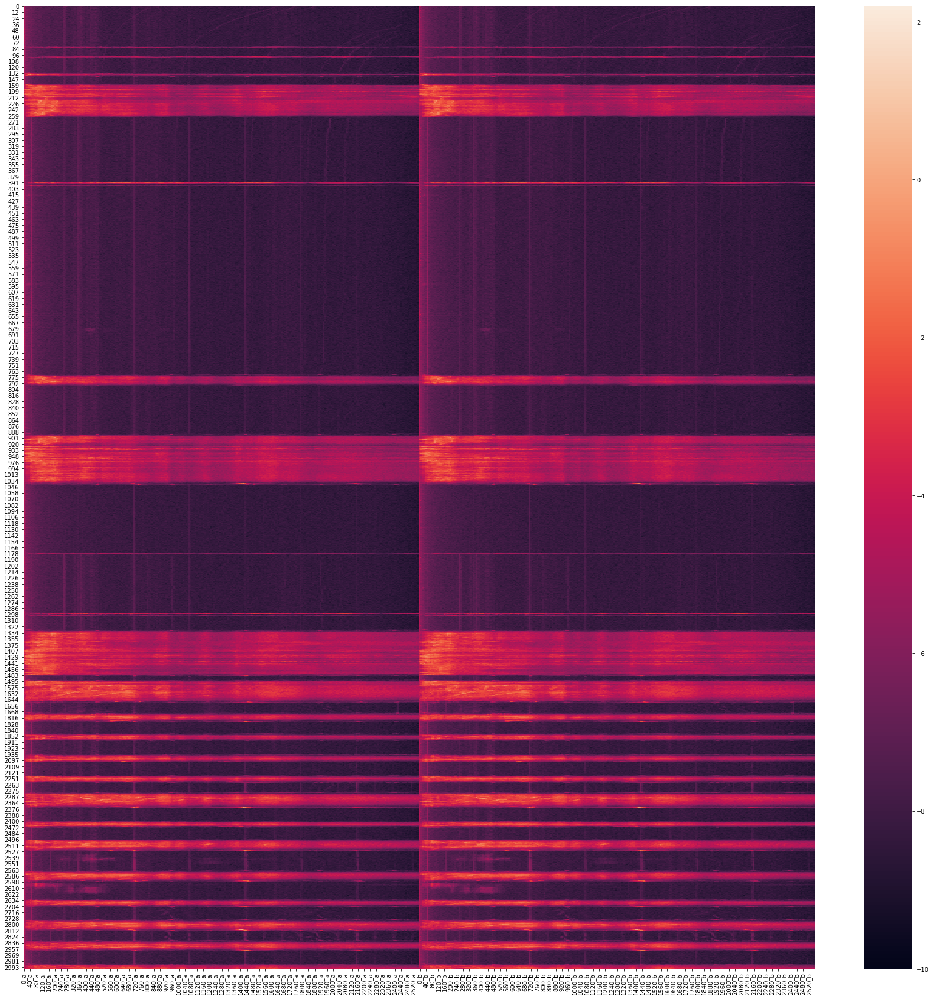

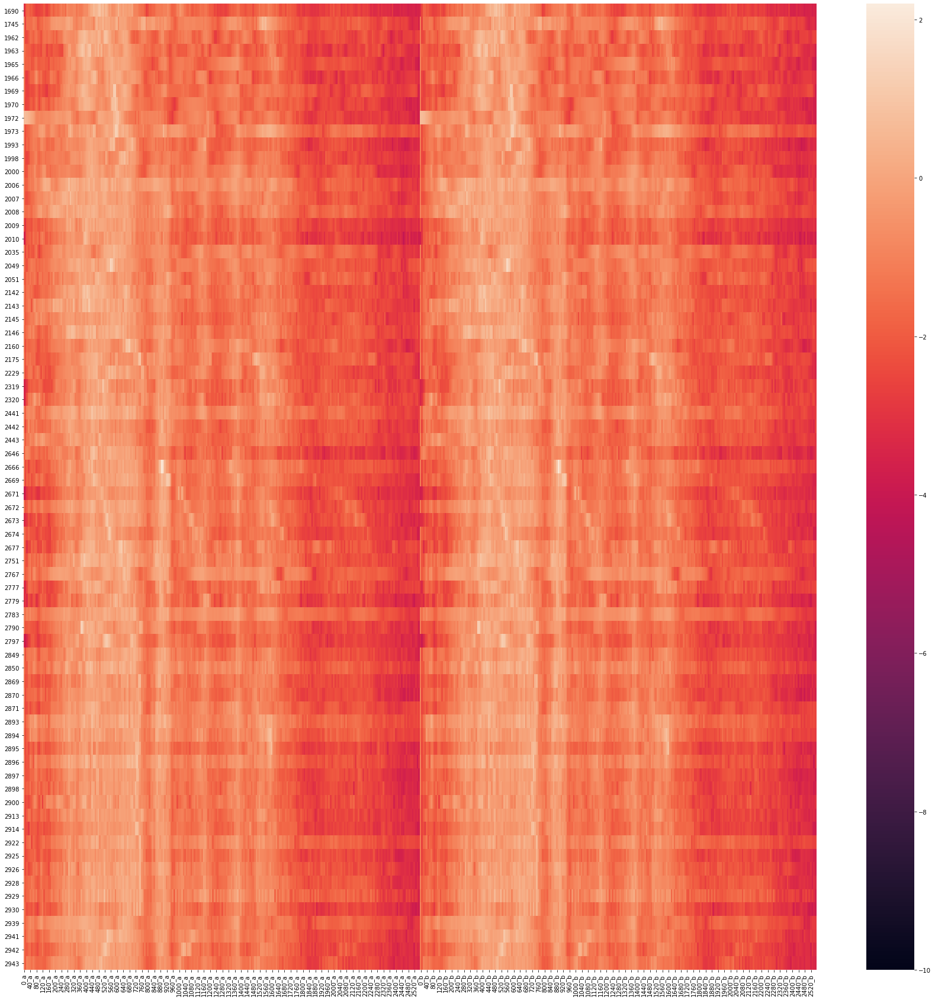

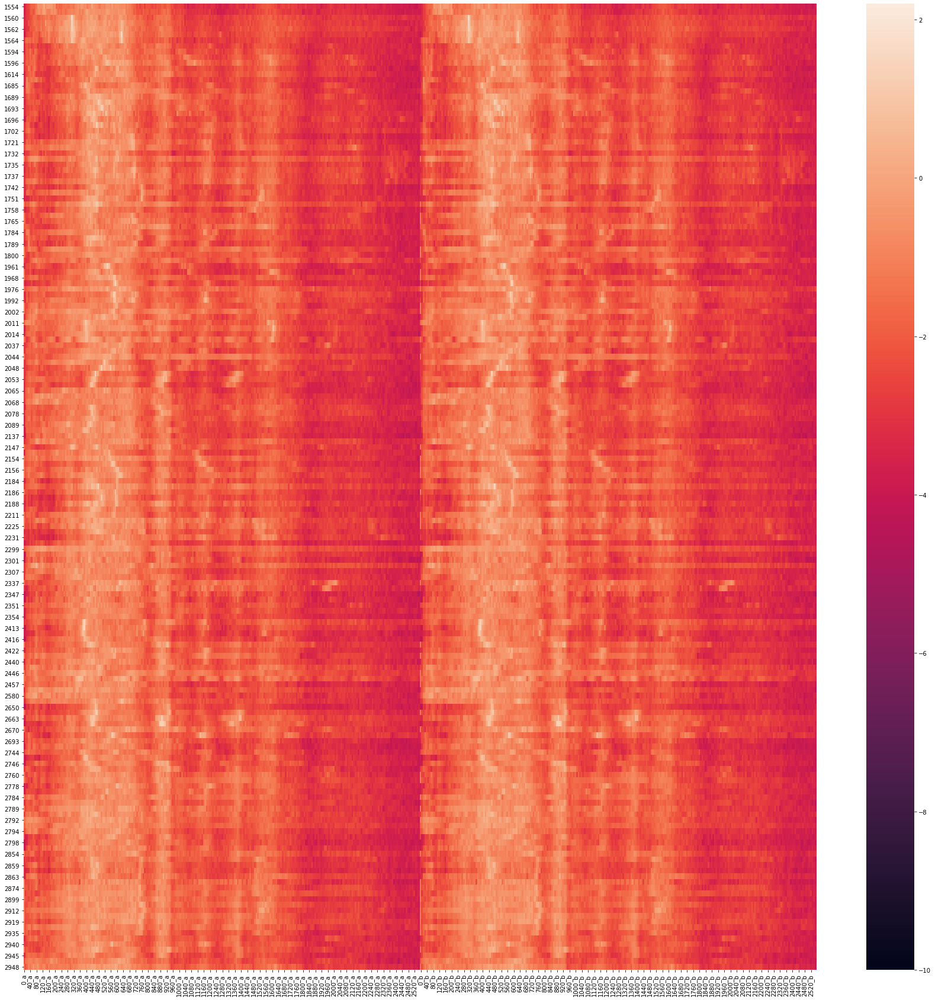

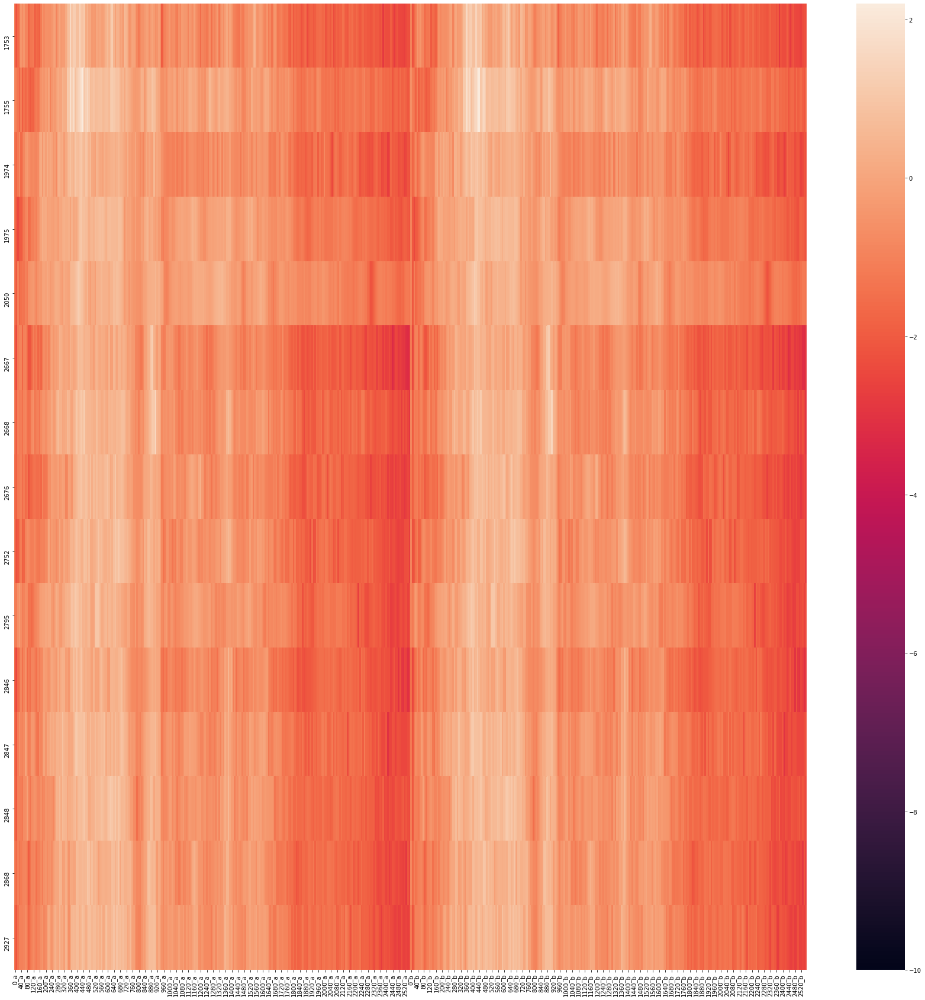

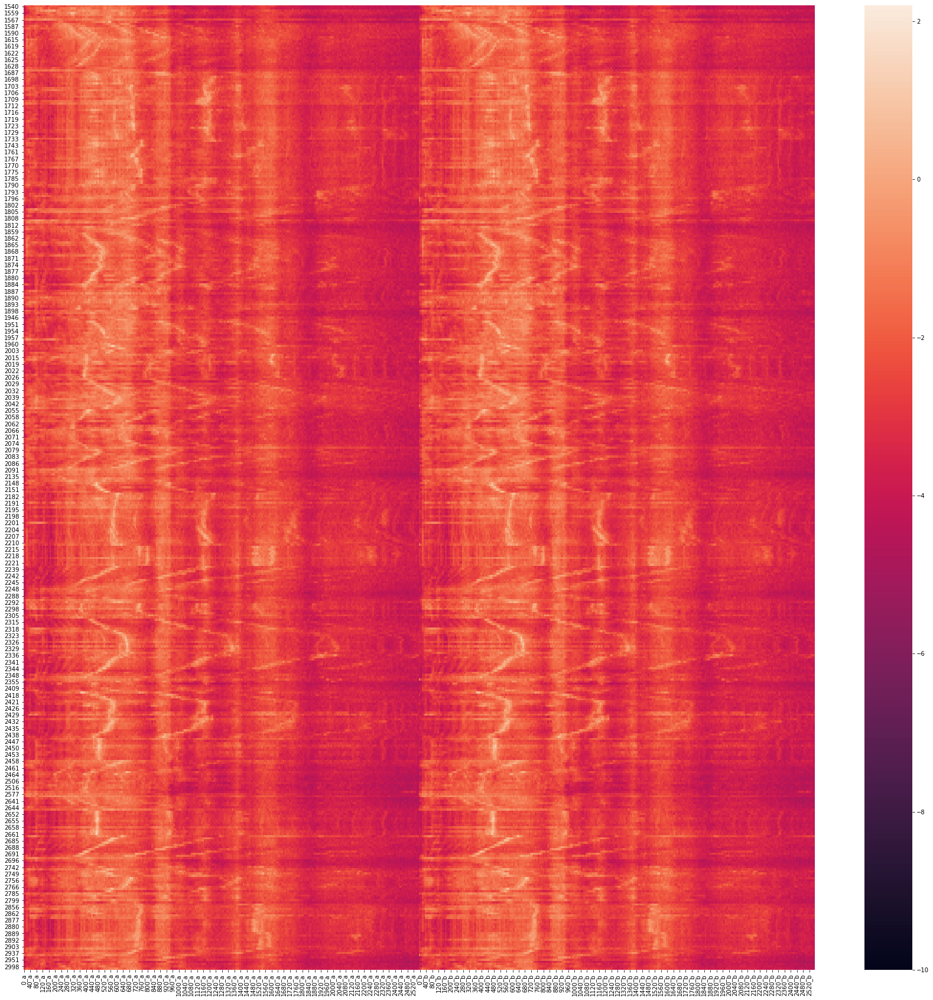

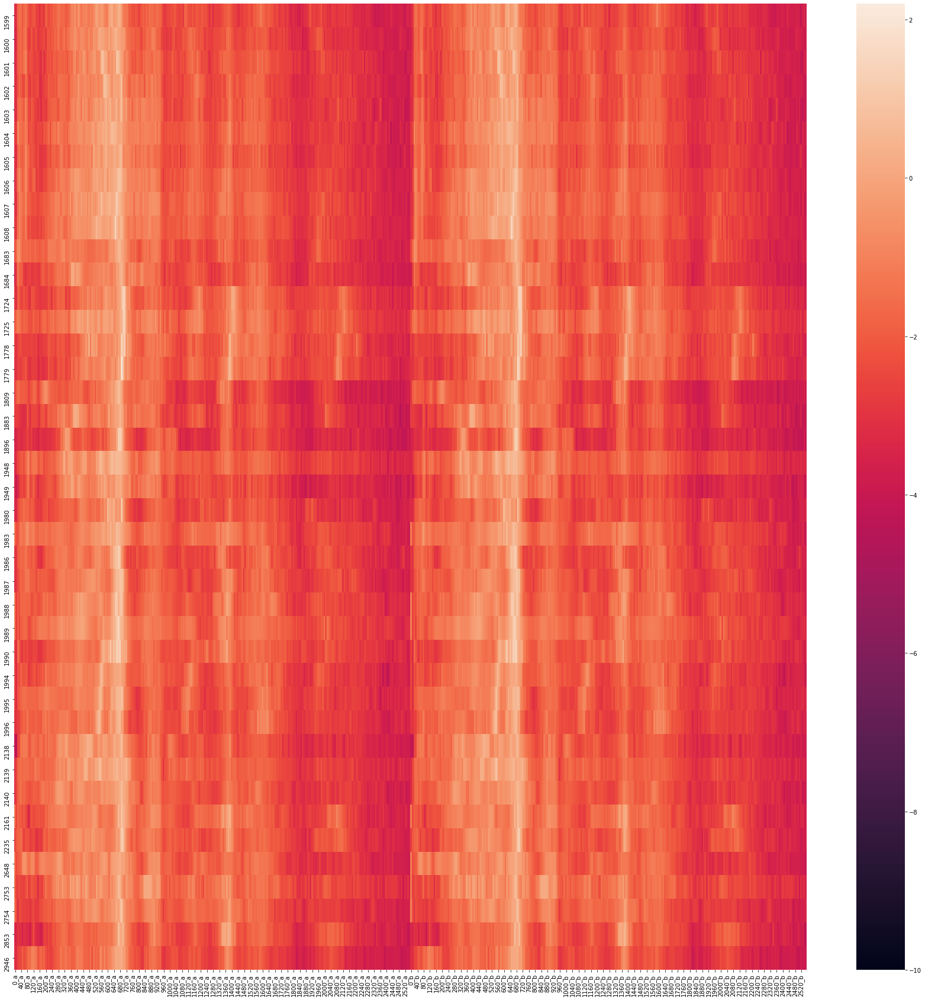

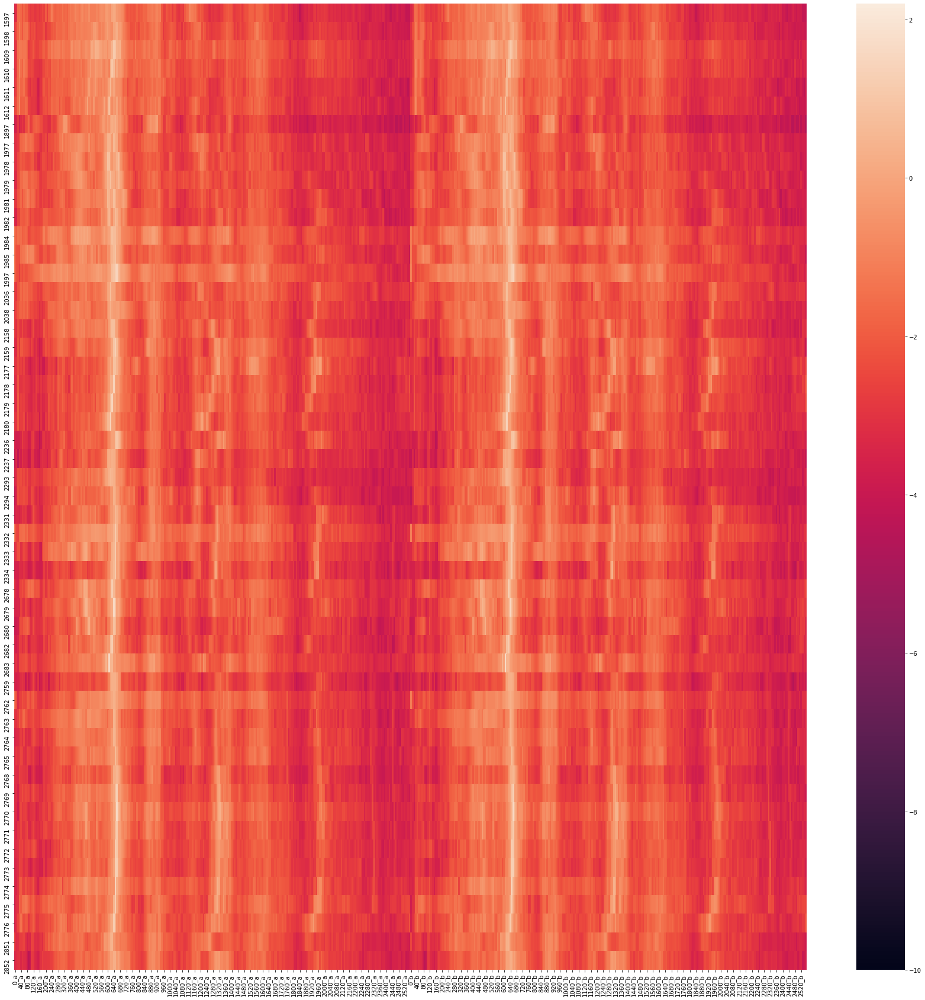

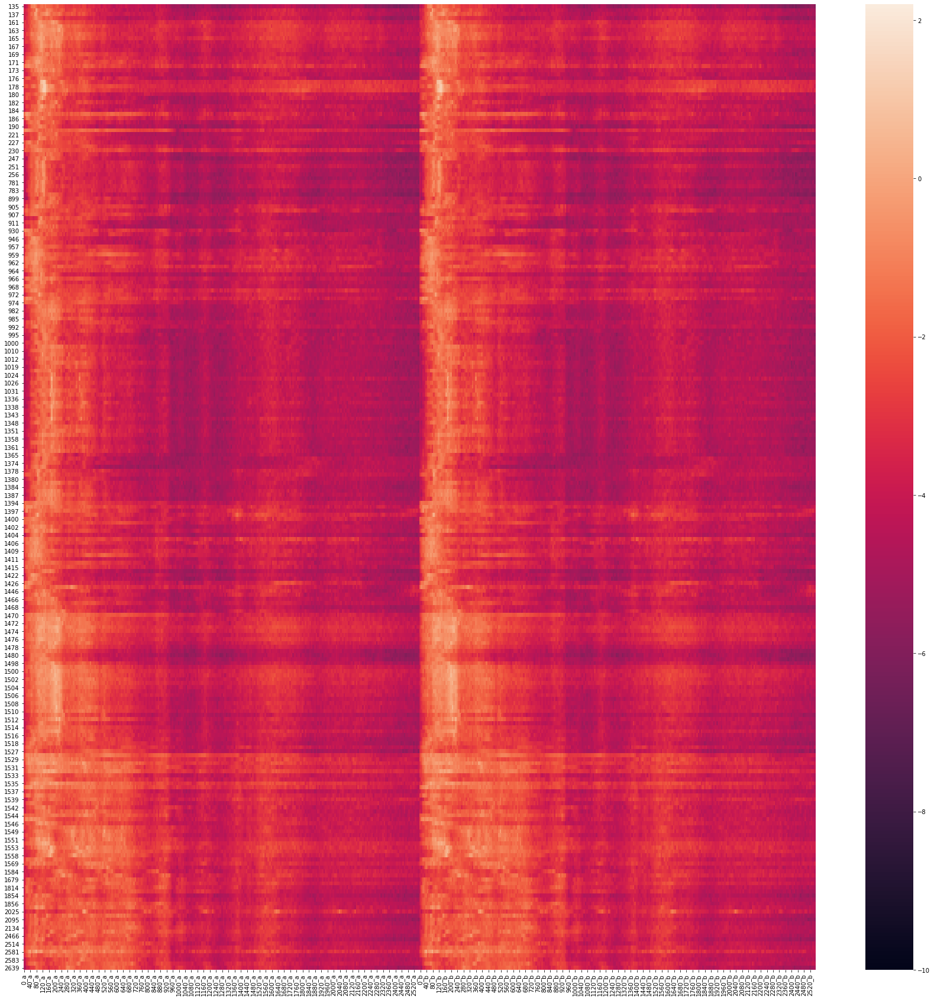

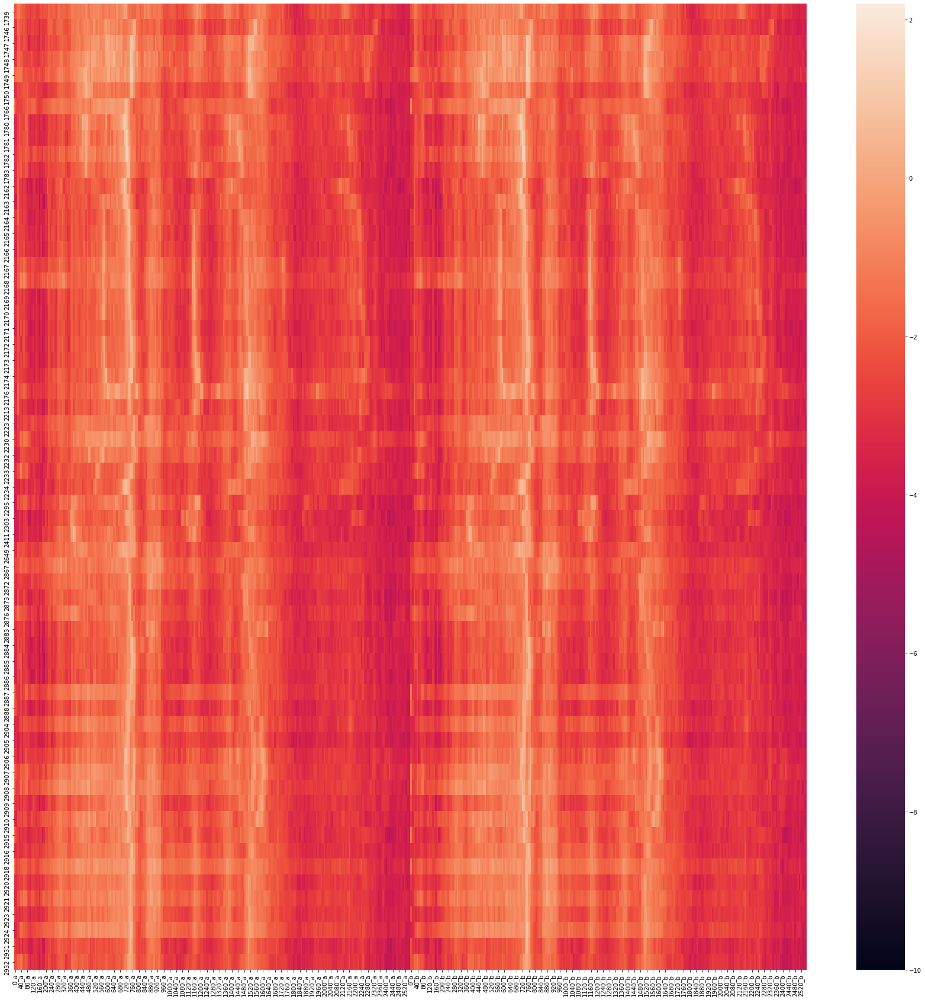

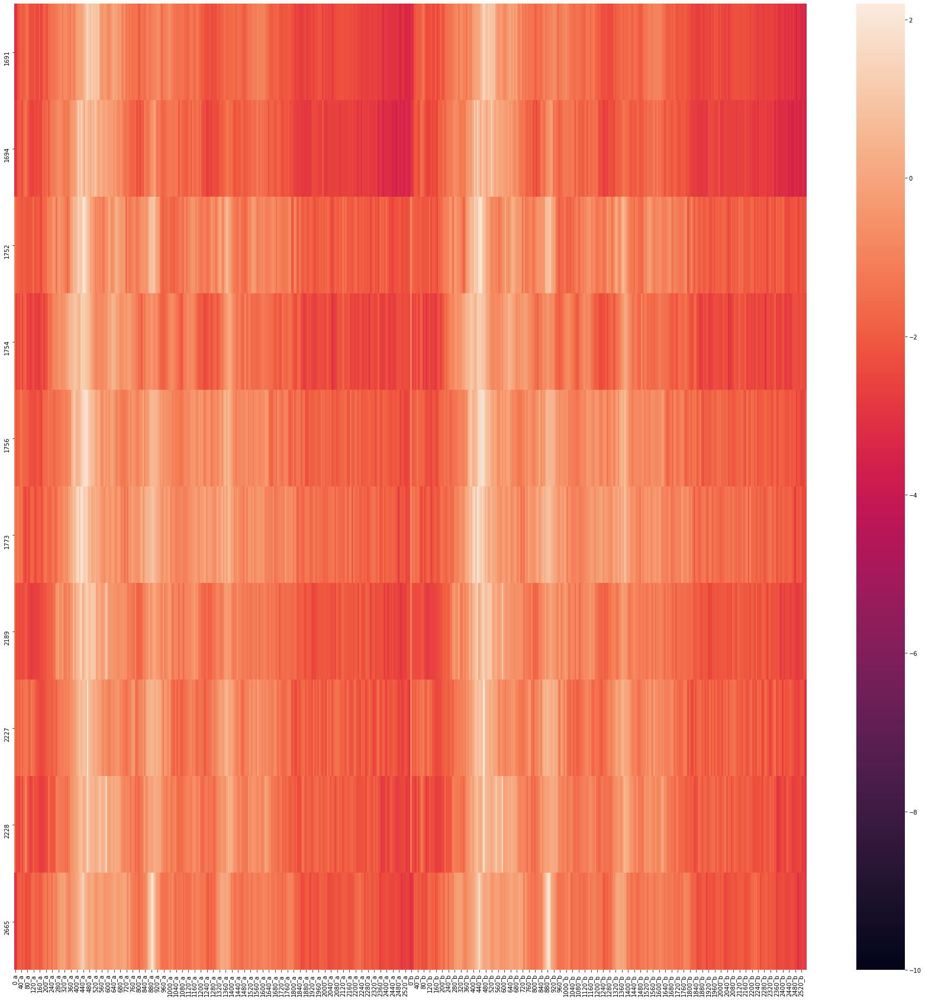

In [7]:
for i in np.arange(0,10):
    plt.figure(figsize=(30,30))
    sb.heatmap(np.log(df.loc[ten.labels_ == i,:]), vmin=-10, vmax=2.2)
    plt.show()

In [9]:
from sklearn.mixture import GaussianMixture
gm = GaussianMixture(n_components =2).fit(np.log(df))

In [10]:
print(gm.get_params())

{'covariance_type': 'full', 'init_params': 'kmeans', 'max_iter': 100, 'means_init': None, 'n_components': 2, 'n_init': 1, 'precisions_init': None, 'random_state': None, 'reg_covar': 1e-06, 'tol': 0.001, 'verbose': 0, 'verbose_interval': 10, 'warm_start': False, 'weights_init': None}


In [11]:
gm_lab = GaussianMixture(n_components =2).fit_predict(np.log(df))

In [12]:
type(gm_lab)

numpy.ndarray

In [13]:
len(gm_lab)

3000

In [14]:
gm_lab.sum()

1603

In [15]:
gm_lab.min()

0

In [16]:
gm_lab.max()

1

In [17]:
gm_lab_norm = (gm_lab *12) -2

In [18]:
df3 = np.log(df)

In [19]:
df3["gm_lab"] = gm_lab_norm


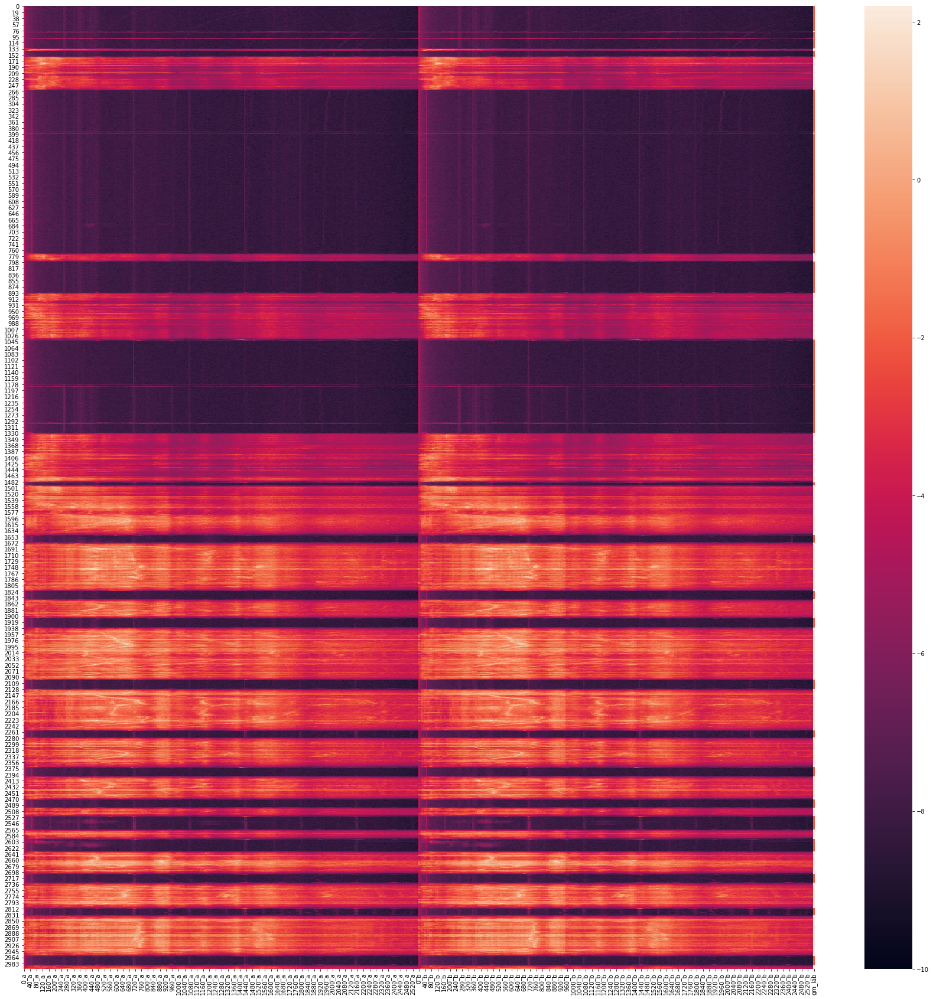

In [21]:
plt.figure(figsize=(30,30))
sb.heatmap(df3, vmin=-10, vmax=2.2)
plt.show()


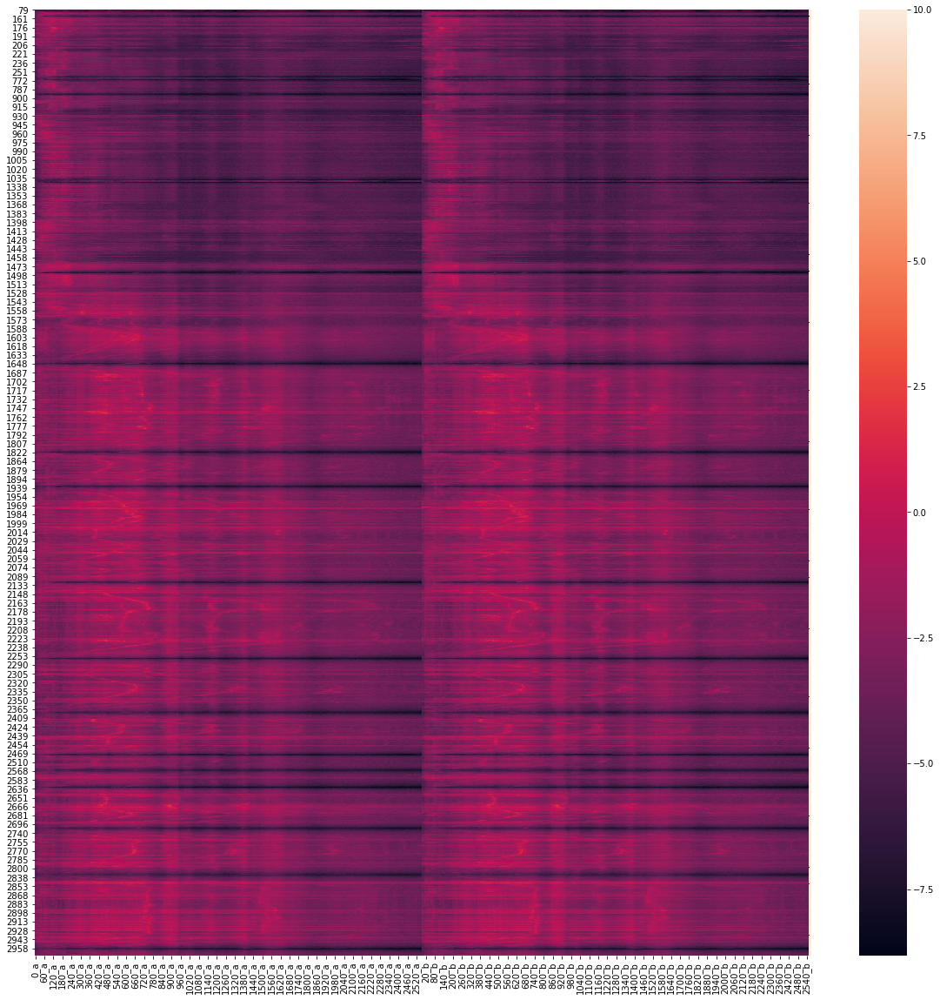

In [24]:
plt.figure(figsize=(20,20))
sb.heatmap(df3.loc[df3["gm_lab"]==10,:])
plt.show()

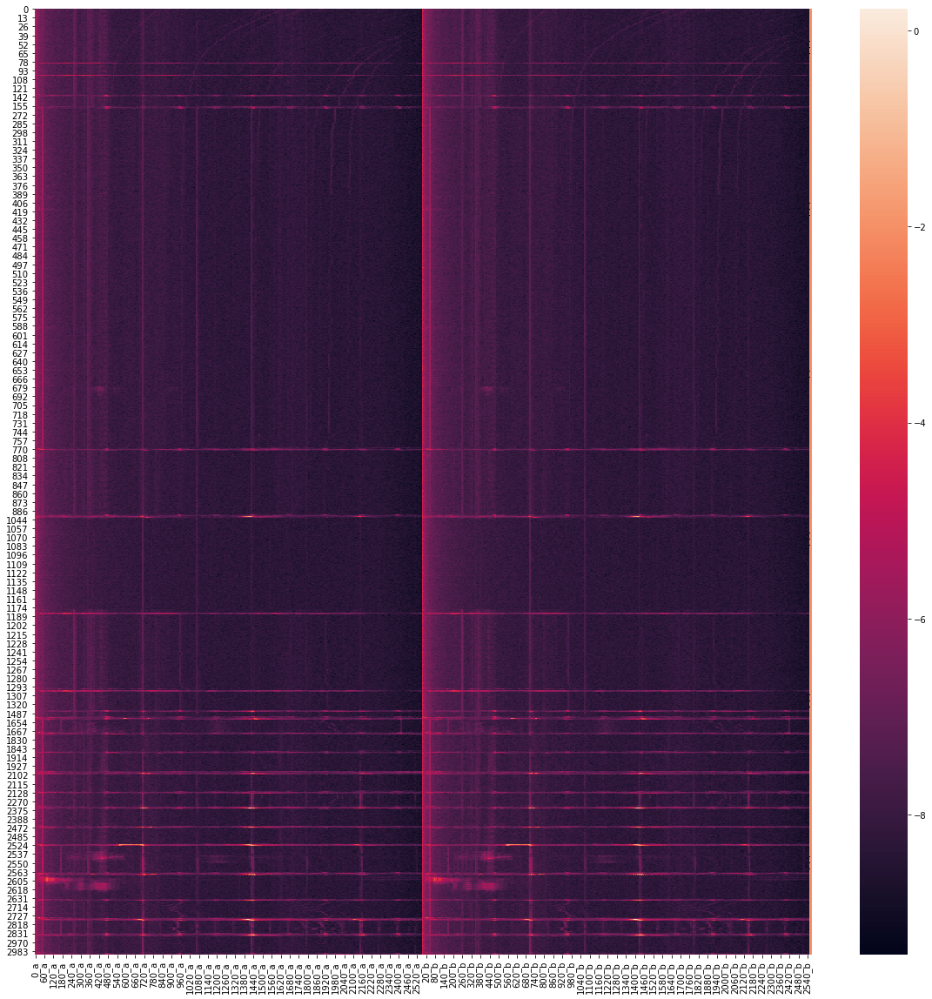

In [25]:
plt.figure(figsize=(20,20))
sb.heatmap(df3.loc[df3["gm_lab"]==-2,:])
plt.show()

In [26]:
df3.loc[df3["gm_lab"]==-2,:].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1397 entries, 0 to 2988
Columns: 513 entries, 0_a to gm_lab
dtypes: float64(512), int64(1)
memory usage: 5.5 MB


In [28]:
df3.loc[df3["gm_lab"]==10,:].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1603 entries, 79 to 2999
Columns: 513 entries, 0_a to gm_lab
dtypes: float64(512), int64(1)
memory usage: 6.3 MB


In [29]:
df3.loc[df3["gm_lab"]==-2,:].mean()

0_a      -4.590536
10_a     -5.787539
20_a     -6.166136
30_a     -6.372766
40_a     -6.523846
            ...   
2520_b   -8.623355
2530_b   -8.667262
2540_b   -8.672966
2550_b   -8.772930
gm_lab   -2.000000
Length: 513, dtype: float64

In [31]:
plt.line(df3.loc[df3["gm_lab"]==-2,:].mean())

AttributeError: module 'matplotlib.pyplot' has no attribute 'line'

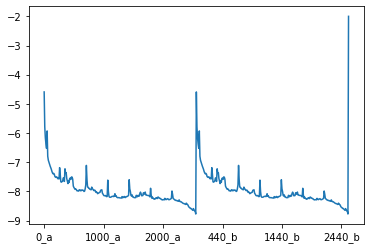

In [34]:
df3.loc[df3["gm_lab"]==-2,:].mean().plot.line()

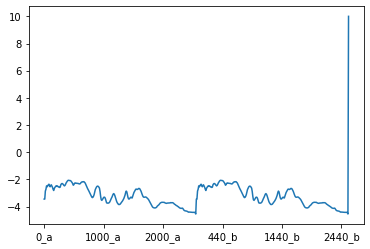

In [35]:
df3.loc[df3["gm_lab"]==10,:].mean().plot.line()

get delta from averages (above) and each sample   [background subtraction]

PCA on both the 1Hz bins and the 10Hz bins want 90% of the explained variance

remove average of stationary noise from whole dataset (quality checks)
then remove average of moving from moving then recluster moving only

covariance analysis. 

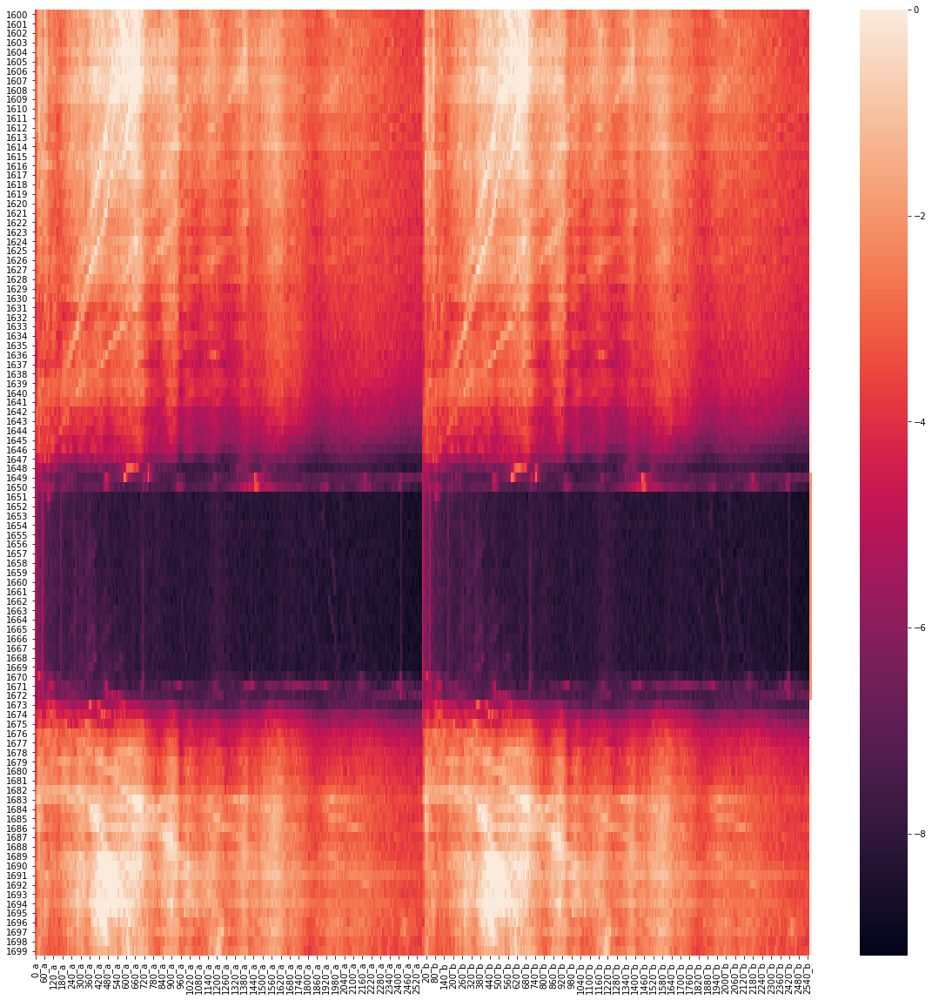

In [40]:
plt.figure(figsize=(20,20))
sb.heatmap(df3.iloc[1600:1700,:], vmax=0)
plt.show()

In [41]:
df4 = df3 - df3.loc[df3["gm_lab"]==-2,:].mean()

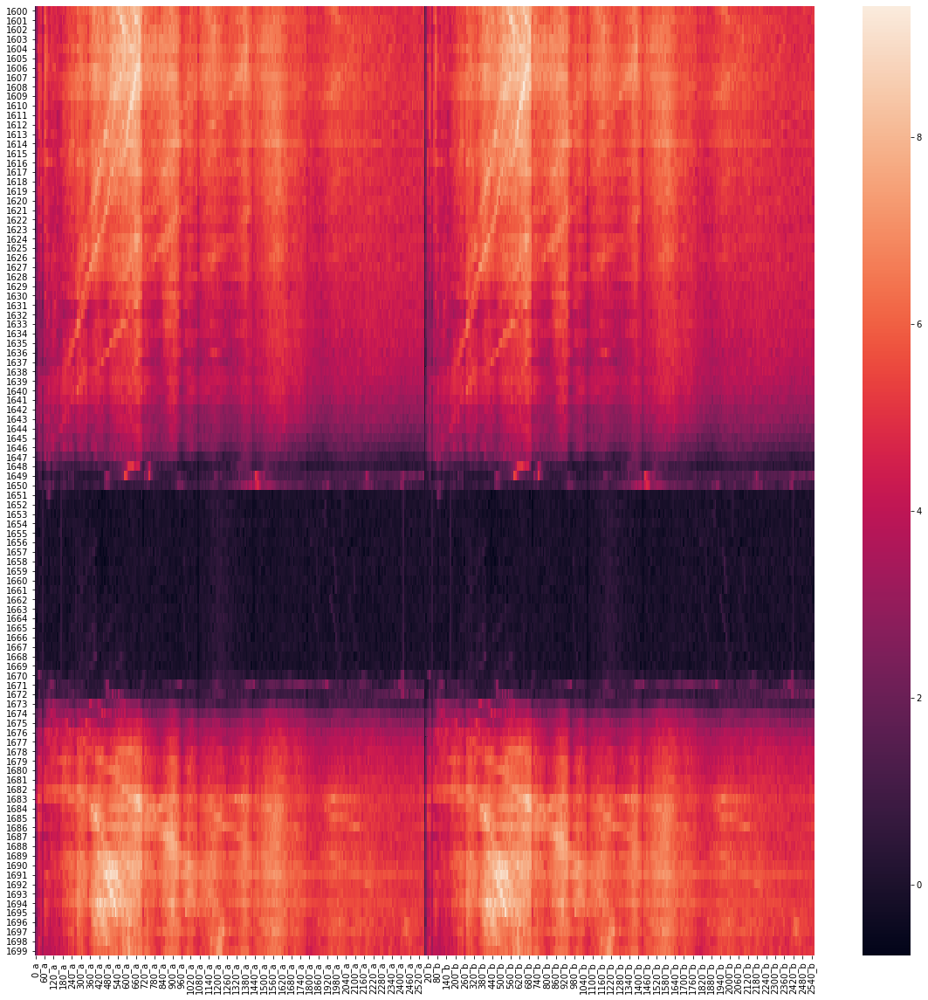

In [44]:
plt.figure(figsize=(20,20))
sb.heatmap(df4.iloc[1600:1700,0:-1])
plt.show()